<a href="https://colab.research.google.com/github/Aa5980/object_dec/blob/main/Aalok_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Environment Setup**

**Install required libraries**

In [ ]:
%tensorflow_version

!pip install -q pillow lxml jupyter matplotlib cython pandas contextlib2
!apt-get install -qq protobuf-compiler
!pip install -q pycocotools tf_slim 
!pip install lvis
!pip install tensorflow-addons

Currently selected TF version: 2.x
Available versions:
* 1.x
* 2.x
     |████████████████████████████████| 358kB 23.6MB/s 
     |████████████████████████████████| 686kB 32.4MB/s 


**Clone Tensorflow models**

In [ ]:
# Clone Tensorflow model repo
%cd /content
!git clone --quiet https://github.com/tensorflow/models.git

/content


In [ ]:
%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.

# Set environment variables
import os
os.environ['PYTHONPATH'] += ':/content/models:/content/models/research/:/content/models/research/slim/'
!python object_detection/builders/model_builder_test.py

/content/models/research
2021-07-10 10:52:12.247877: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [ ]:
!pip install cython
!pip install git+https://github.com/philferriere/cocoapi.git#subdirectory=PythonAPI

  Cloning https://github.com/philferriere/cocoapi.git to /tmp/pip-req-build-olsngly1
  Running command git clone -q https://github.com/philferriere/cocoapi.git /tmp/pip-req-build-olsngly1
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=264112 sha256=52d3675193929aac63d86d236c72b3e8fe47294d4a6d5d74e66dbb6953717bbe
  Stored in directory: /tmp/pip-ephem-wheel-cache-3wtj826g/wheels/69/2b/12/2fa959e49f73d26cff202c2f4e5079096c9c57c8a8509fd75c
Successfully built pycocotools
  Found existing installation: pycocotools 2.0.2
    Uninstalling pycocotools-2.0.2:
      Successfully uninstalled pycocotools-2.0.2


In [ ]:
%cd /content/models/research
!cp object_detection/packages/tf2/setup.py .
!python -m pip install --use-feature=2020-resolver .

/content/models/research

Usage:   
  /usr/bin/python3 -m pip install [options] <requirement specifier> [package-index-options] ...
  /usr/bin/python3 -m pip install [options] -r <requirements file> [package-index-options] ...
  /usr/bin/python3 -m pip install [options] [-e] <vcs project url> ...
  /usr/bin/python3 -m pip install [options] [-e] <local project path> ...
  /usr/bin/python3 -m pip install [options] <archive url/path> ...

no such option: --use-feature



**COCO API Installation**

In [ ]:
%cd /content
!git clone --quiet https://github.com/cocodataset/cocoapi.git
%cd cocoapi/PythonAPI
!make
!cp -r pycocotools /content/models/research/

/content
/content/cocoapi/PythonAPI
python setup.py build_ext --inplace
running build_ext
cythoning pycocotools/_mask.pyx to pycocotools/_mask.c
/usr/local/lib/python3.7/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/cocoapi/PythonAPI/pycocotools/_mask.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'pycocotools._mask' extension
creating build
creating build/common
creating build/temp.linux-x86_64-3.7
creating build/temp.linux-x86_64-3.7/pycocotools
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fdebug-prefix-map=/build/python3.7-OGiuun/python3.7-3.7.10=. -fstack-protector-strong -Wformat -Werror=format-security -g -fdebug-prefix-map=/build/python3.7-OGiuun/python3.7-3.7.10=. -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/local/lib/pytho


**Set configurations**

In [ ]:
import os

# Repo URL
repo_url = 'https://github.com/Aa5980/object_dec'

# Models
MODELS_CONFIG = {
    'ssd_mobilenet_v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'model_path': '/models/tf2/my_ssd_mobilenet_v2/',
        'pipeline_file': 'pipeline.config'
    },
    'ssd_mobilenet_v2_fpn': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'model_path': '/models/tf2/my_ssd_mobilenet_v2_fpnlite/',
        'pipeline_file': 'pipeline.config'
    },
    'my_centernet_resnet50_v1_fpn': {
        'model_name': 'centernet_resnet50_v1_fpn_512x512_coco17_tpu-8',
        'model_path': '/models/tf2/my_centernet_resnet50_v1_fpn/',
        'pipeline_file': 'pipeline.config'
    },
    'my_centernet_resnet101_v1_fpn': {
        'model_name': 'centernet_resnet101_v1_fpn_512x512_coco17_tpu-8',
        'model_path': '/models/tf2/my_centernet_resnet101_v1_fpn/',
        'pipeline_file': 'pipeline.config'
    },
    'my_ssd_resnet50_v1_fpn':{
        'model_name': 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8',
        'model_path': '/models/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/',
        'pipeline_file': 'pipeline.config'
    }

}

# Select a model to use.
selected_model = 'my_ssd_resnet50_v1_fpn'

model_name = MODELS_CONFIG[selected_model]['model_name']
model_path = MODELS_CONFIG[selected_model]['model_path']
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

# Set Repository Home Directory
repo_dir_path = os.path.join('/content/', os.path.basename(repo_url))

**Download Pretrained Model**

In [ ]:
%cd /content/models/research

import os
import shutil
import glob
import urllib.request
import tarfile
MODEL_FILE = model_name + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/'
DEST_DIR = '/content/models/research/pretrained_model'

if not (os.path.exists(MODEL_FILE)):
    urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(model_name, DEST_DIR)

# Check downloaded files
!echo {DEST_DIR}
!ls -alh {DEST_DIR}

# Set fine tune checkpoint
fine_tune_checkpoint = os.path.join(DEST_DIR, "checkpoint/ckpt-0")
pretrained_config_fname = os.path.join(DEST_DIR, "pipeline.config")
print("fine_tune_checkpoint: ", fine_tune_checkpoint)
print("Pretrained config file is located at ", pretrained_config_fname)

/content/models/research
/content/models/research/pretrained_model
total 24K
drwxr-x---  4 345018 89939 4.0K Jul 11  2020 .
drwxr-xr-x 24 root   root  4.0K Jul 10 10:53 ..
drwxr-x---  2 345018 89939 4.0K Jul 10  2020 checkpoint
-rw-r-----  1 345018 89939 4.4K Jul 11  2020 pipeline.config
drwxr-x---  4 345018 89939 4.0K Jul 10  2020 saved_model
fine_tune_checkpoint:  /content/models/research/pretrained_model/checkpoint/ckpt-0
Pretrained config file is located at  /content/models/research/pretrained_model/pipeline.config


**Clone the project repository**

In [ ]:
import os
%cd /content
# Clean up
!rm -rf {repo_dir_path}

# Clone
!git clone {repo_url}

# Pull (just in case the repo already exists)
%cd {repo_dir_path}
!git pull


# Check if label map and pipeline files exist
#assert os.path.isfile(label_map_pbtxt_fname), '`{}` not exist'.format(label_map_pbtxt_fname)
#assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)

/content
Cloning into 'object_dec'...
remote: Enumerating objects: 1370, done.
remote: Counting objects: 100% (190/190), done.
remote: Compressing objects: 100% (178/178), done.
remote: Total 1370 (delta 94), reused 9 (delta 9), pack-reused 1180
Receiving objects: 100% (1370/1370), 32.69 MiB | 34.76 MiB/s, done.
Resolving deltas: 100% (649/649), done.
/content/object_dec
Already up to date.


In [ ]:
# Set Label Map (.pbtxt) path and pipeline.config pat

# Set output directories and clean up
model_dir = repo_dir_path + '/models/'
output_dir = repo_dir_path + '/exported-models/'
#trained_dir = repo_dir_path + '/models'
%cd /content
!rm -rf {model_dir} {output_dir} {pretrained_dir} 
os.makedirs(model_dir, exist_ok=True)
os.makedirs(output_dir, exist_ok=True)
#os.makedirs(model_dir + '/' + selected_model + "/" , exist_ok = True)
#os.makedirs(pretrained_dir, exist_ok = True)

/content


In [ ]:
import shutil

In [ ]:
label_map_pbtxt_fname = repo_dir_path + '/annotations/label_map.pbtxt'
# Set .record path
test_record_fname = repo_dir_path + '/annotations/test.record'
train_record_fname = repo_dir_path + '/annotations/train.record'
pipeline_fname = repo_dir_path + '/pipeline_fname/init'

In [ ]:
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=30, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())

In [ ]:
print(pipeline_fname)

/content/object_dec/pipeline_fname/init


In [ ]:
# Check pipeline config - update if required
!cat {pipeline_fname}

model {
  ssd {
    num_classes: 3
    image_resizer {
      fixed_shape_resizer {
        height: 640
        width: 640
      }
    }
    feature_extractor {
      type: "ssd_resnet50_v1_fpn_keras"
      depth_multiplier: 1.0
      min_depth: 16
      conv_hyperparams {
        regularizer {
          l2_regularizer {
            weight: 0.0004
          }
        }
        initializer {
          truncated_normal_initializer {
            mean: 0.0
            stddev: 0.03
          }
        }
        activation: RELU_6
        batch_norm {
          decay: 0.997
          scale: true
          epsilon: 0.001
        }
      }
      override_base_feature_extractor_hyperparams: true
      fpn {
        min_level: 3
        max_level: 7
      }
    }
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatc

In [ ]:
print(repo_dir_path)

/content/object_dec


In [ ]:
%cd {repo_dir_path}

!python generate_tfrecord.py -c annotations/train_labels.csv -i images/train -x images/train -o annotations/train.record -l annotations/label_map.pbtxt

# Create test data:
!python generate_tfrecord.py -c annotations/test_labels.csv -i images/test -x images/test -o annotations/test.record -l annotations/label_map.pbtxt

/content/object_dec
Successfully created the TFRecord file: annotations/train.record
Successfully created the CSV file: annotations/train_labels.csv
Successfully created the TFRecord file: annotations/test.record
Successfully created the CSV file: annotations/test_labels.csv


In [ ]:
# Check
assert os.path.isfile(test_record_fname), '`{}` not exist'.format(test_record_fname)
assert os.path.isfile(train_record_fname), '`{}` not exist'.format(train_record_fname)

## **Training**

**Tensorboard**

In [ ]:
# Set log directory for tensorboard to watch
LOG_DIR = model_dir

# Clean up the directory
!rm -rf {LOG_DIR}/*

In [ ]:
print(model_dir)

/content/object_dec/models/


In [ ]:

# Use magic command to launch tensorboard within the notebook
%load_ext tensorboard
%tensorboard --logdir {LOG_DIR}

<IPython.core.display.Javascript object>

# **Train!**

In [ ]:
%cd {repo_dir_path}
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_fname} \
    --model_dir={model_dir} \
    --alsologtostderr

/content/object_dec
2021-07-10 10:56:52.505150: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-07-10 10:56:55.930185: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-07-10 10:56:55.991135: E tensorflow/stream_executor/cuda/cuda_driver.cc:328] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-07-10 10:56:55.991208: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (418487b65067): /proc/driver/nvidia/version does not exist
W0710 10:56:55.993489 140044598327168 cross_device_ops.py:1387] There are non-GPU devices in `tf.distribute.Strategy`, not using nccl allreduce.
W0710 10:56:55.993789 140044598327168 mirrored_strategy.py:379] Collective ops is not configured at program startup. Some performance features may not be enabled.
INFO:tensorflow:Usin

**Evaluation (Optional)**

In [ ]:
%cd {repo_dir_path}
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_fname} \
    --model_dir={model_dir} \
    --checkpoint_dir= {model_dir} \
    --eval_timeout=60

/content/object_dec
2021-06-27 16:13:45.259748: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-27 16:13:47.331606: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-27 16:13:47.366406: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-27 16:13:47.367069: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-27 16:13:47.367122: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-27 16:13:47.370703: I tensorflow/stream_execu

In [ ]:
# Check the generated files
!ls -lrt {model_dir}

total 1115060
-rw-r--r-- 1 root root 126985023 Jun 27 14:48 ckpt-1.data-00000-of-00001
-rw-r--r-- 1 root root     31394 Jun 27 14:48 ckpt-1.index
-rw-r--r-- 1 root root 253639093 Jun 27 15:06 ckpt-2.data-00000-of-00001
-rw-r--r-- 1 root root     56581 Jun 27 15:06 ckpt-2.index
-rw-r--r-- 1 root root 253639093 Jun 27 15:24 ckpt-3.data-00000-of-00001
-rw-r--r-- 1 root root     56581 Jun 27 15:24 ckpt-3.index
-rw-r--r-- 1 root root 253639093 Jun 27 15:55 ckpt-4.data-00000-of-00001
-rw-r--r-- 1 root root     56581 Jun 27 15:55 ckpt-4.index
-rw-r--r-- 1 root root 253639093 Jun 27 16:13 ckpt-5.data-00000-of-00001
-rw-r--r-- 1 root root     56581 Jun 27 16:13 ckpt-5.index
-rw-r--r-- 1 root root       520 Jun 27 16:13 checkpoint
drwxr-xr-x 2 root root      4096 Jun 27 16:14 train


**Export the output model**

In [ ]:
%cd {repo_dir_path}
!python /content/models/research/object_detection/exporter_main_v2.py \
    --input_type image_tensor \
    --pipeline_config_path {pipeline_fname} \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_dir}

/content/object_dec
2021-06-27 16:15:55.678587: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-27 16:15:57.289920: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-27 16:15:57.321602: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-27 16:15:57.322340: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-27 16:15:57.322392: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-27 16:15:57.325518: I tensorflow/stream_execu

In [ ]:
# Check the output files
!echo {output_dir}
!ls -lsr {output_dir}

/content/object_dec/exported-models/
total 16
4 drwxr-xr-x 4 root root 4096 Jun 27 16:16 saved_model
8 -rw-r--r-- 1 root root 4295 Jun 27 16:16 pipeline.config
4 drwxr-xr-x 2 root root 4096 Jun 27 16:16 checkpoint



# **Archive the output directory**

In [ ]:
%cd {repo_dir_path}
!tar zcvf trained_model.tar.gz {output_dir}

/content/object_dec
tar: Removing leading `/' from member names
/content/object_dec/exported-models/
/content/object_dec/exported-models/pipeline.config
/content/object_dec/exported-models/saved_model/
/content/object_dec/exported-models/saved_model/assets/
/content/object_dec/exported-models/saved_model/variables/
/content/object_dec/exported-models/saved_model/variables/variables.index
/content/object_dec/exported-models/saved_model/variables/variables.data-00000-of-00001
/content/object_dec/exported-models/saved_model/saved_model.pb
/content/object_dec/exported-models/checkpoint/
/content/object_dec/exported-models/checkpoint/ckpt-0.data-00000-of-00001
/content/object_dec/exported-models/checkpoint/ckpt-0.index
/content/object_dec/exported-models/checkpoint/checkpoint



## **Prediction using the trained model**

**Set images for the inference**

In [ ]:
import os

# Use images in test dir (update this if you have other images for inference)
IMAGE_DIR = os.path.join(repo_dir_path, "images", "test")
IMAGE_PATHS = []

for file in os.listdir(IMAGE_DIR):
    if file.endswith(".jpg") or file.endswith(".png") or file.endswith(".jpeg"):
        IMAGE_PATHS.append(os.path.join(IMAGE_DIR, file))

IMAGE_PATHS

['/content/object_dec/images/test/download (1).jpeg',
 '/content/object_dec/images/test/helmet13.jpg',
 '/content/object_dec/images/test/images (1).jpeg',
 '/content/object_dec/images/test/images.jpeg',
 '/content/object_dec/images/test/heat17.jpg',
 '/content/object_dec/images/test/pos_462.jpg',
 '/content/object_dec/images/test/download.jpeg',
 '/content/object_dec/images/test/74_11zon.jpg',
 '/content/object_dec/images/test/vest10.jpg',
 '/content/object_dec/images/test/download (2).jpeg']

In [ ]:
!pip install tensorflow-object-detection-api

**Load the trained model**

In [ ]:
%cd /content

import time
import tensorflow as tf # Added as colab instance often crash
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

# Label Map path
PATH_TO_LABELS = label_map_pbtxt_fname
# Saved model path
PATH_TO_SAVED_MODEL = os.path.join(output_dir, "saved_model")

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# Set category index

/content
Loading model...Done! Took 12.222515344619751 seconds


In [ ]:
category_index = {1: {'id': 1, 'name': 'fire'}, 2: {'id': 2, 'name': 'heat'}, 3: {'id': 3, 'name': 'safety'},4: {'id': 4, 'name': 'vest'}}

**Make prediction!**

Running inference for /content/object_dec/images/test/download (1).jpeg... Done
Running inference for /content/object_dec/images/test/helmet13.jpg... Done
Running inference for /content/object_dec/images/test/images (1).jpeg... Done
Running inference for /content/object_dec/images/test/images.jpeg... Done
Running inference for /content/object_dec/images/test/heat17.jpg... Done
Running inference for /content/object_dec/images/test/pos_462.jpg... Done
Running inference for /content/object_dec/images/test/download.jpeg... Done
Running inference for /content/object_dec/images/test/74_11zon.jpg... Done
Running inference for /content/object_dec/images/test/vest10.jpg... Done
Running inference for /content/object_dec/images/test/download (2).jpeg... Done


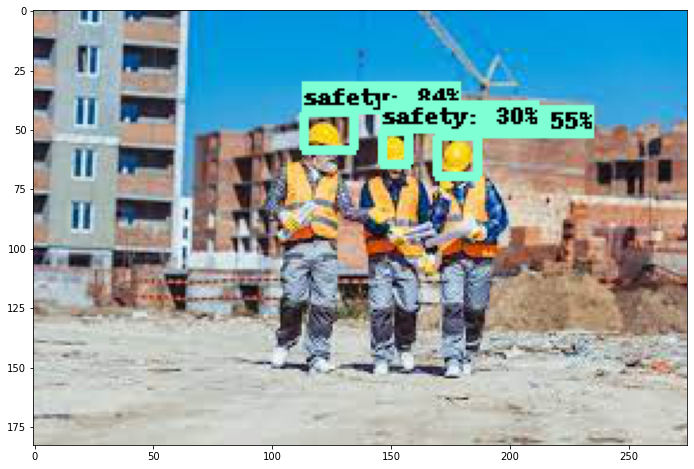

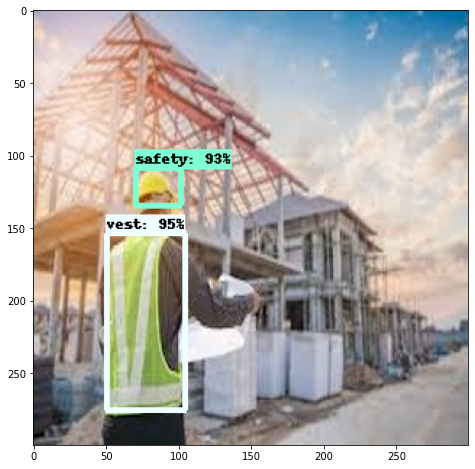

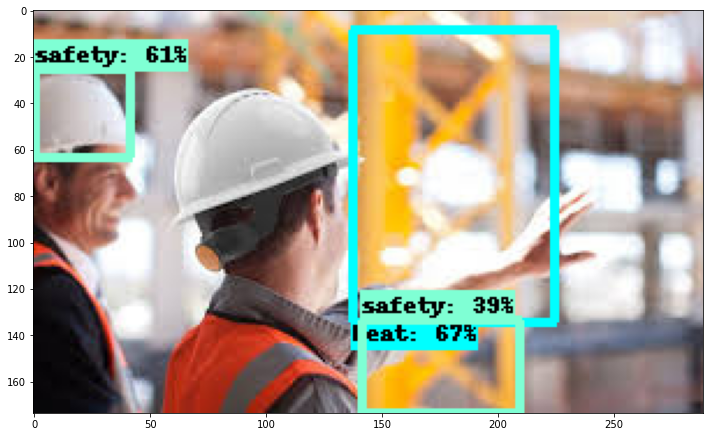

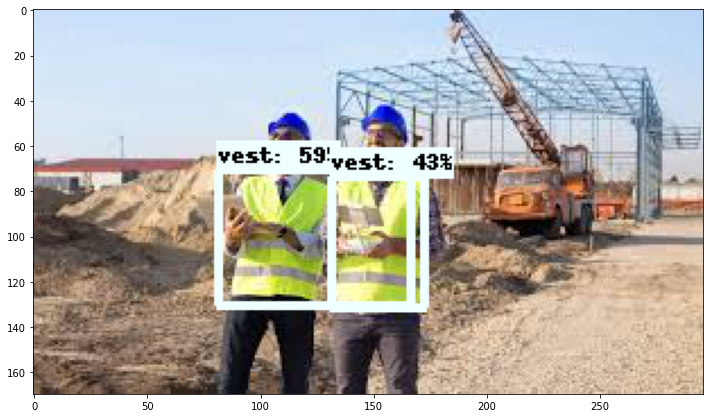

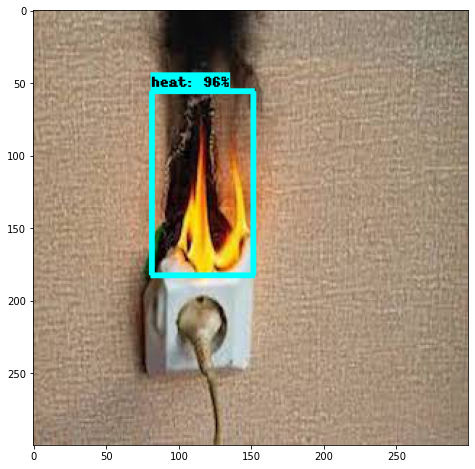

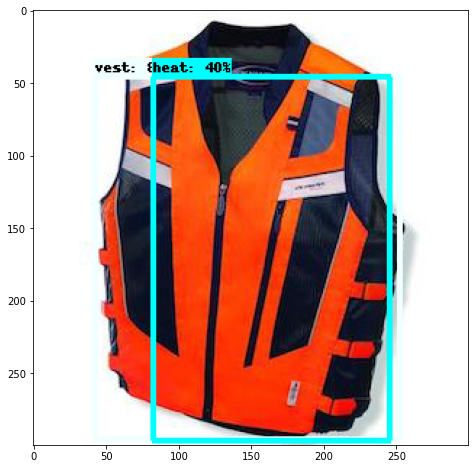

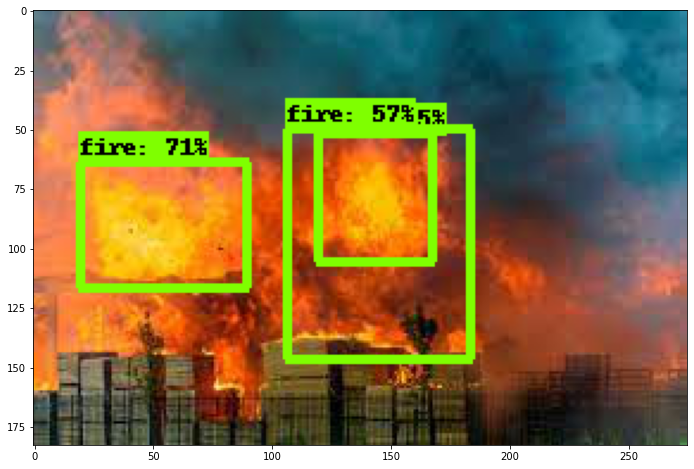

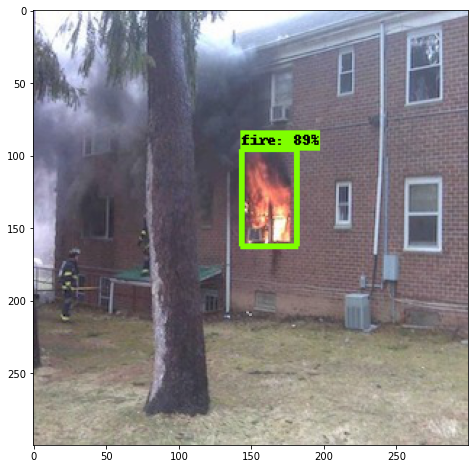

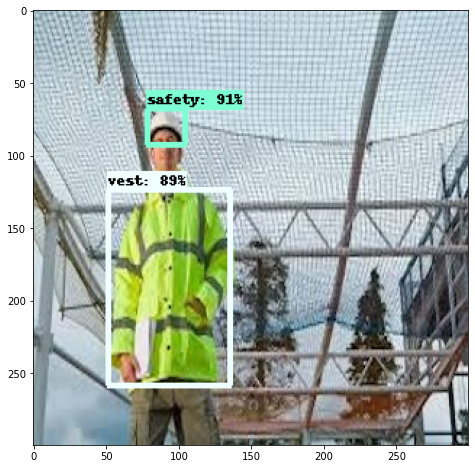

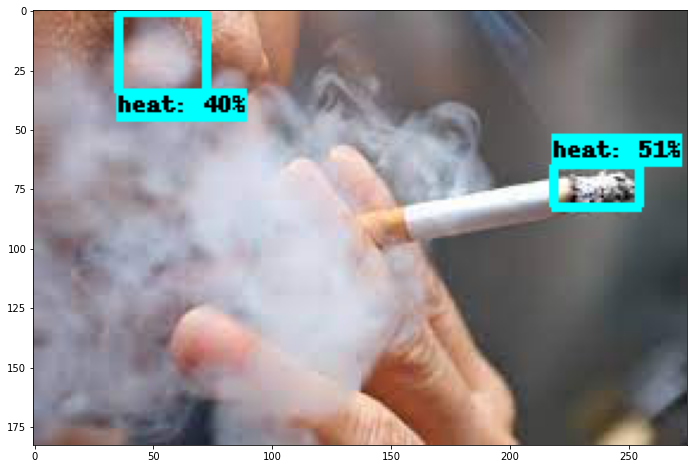

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings
# This is required to display the images.
%matplotlib inline 

for image_path in IMAGE_PATHS:

    print('Running inference for {}... '.format(image_path), end='')

    # Puts image into numpy array to feed into tensorflow graph.
    # Note that by convention we put it into a numpy array with shape
    #   (height, width, channels), where channels=3 for RGB.
    image_np = np.array(Image.open(image_path))

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)

    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=20,
          min_score_thresh=.30,
          agnostic_mode=False)

    plt.figure(figsize = (12,8))
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()